This notebook gives an overview of all the different methods to simulate, visualize, locate and track particles. 

We start with importing the packages

In [204]:
import trackpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
from matplotlib.animation import FuncAnimation
matplotlib.rcParams['animation.embed_limit'] = 2**128
import time
import pims
import math
from math import cos, exp, pi
from scipy.integrate import quad

from Particledrop import Landing_Flashes

We use the next function to visualize the simulation as a movie.

In [137]:
def execute_amovie(moviedata):
    plt.rcParams["animation.html"] = "jshtml"
    plt.rcParams['figure.dpi'] = 100  
    plt.ioff()
    
    fig = plt.figure()
    axis = plt.axes()
    
    film = plt.imshow(moviedata[0])
    
    def init(): 
        film.set_data(moviedata[0])
        return [film]
    
    def animate(i):
        film.set_array(moviedata[i])
        return [film]
    
    anim = FuncAnimation(fig, animate, frames = moviedata.shape[0], init_func = init, interval = 500, blit = True)

    return anim

Next we define the simulation parameters. The resulting video shows the particles landing. 
The numbers in brackects denote the number of particles simulated and the number of axes(n,x,y), respectively. 

!!! Mind that the number of frames (nf) >> number of particles (numpar). Rule of thumb: nf = 2*numpar????

In [180]:
nf = 20  # define how many frames make up the simulation
fov = [200, 300]  # define the parameters of the field-of-view, pixels
meas = Landing_Flashes(fov=fov, seed=3000, numpar=10, noise=0.1, nframes=nf, signal=20, sizevar=0.2, dark=5, psize=4, unevenIllumination=False)
testframe = nf
meas.noise = 0.1
plis = meas.parlist
movie = meas.genStack()
sig = meas.genStack()
print(np.shape(plis))

execute_amovie(movie)

(10, 3)


In [181]:
#This function makes a Histogram of all intensities in a movie. Use this 
def Histogram_intensities(movie):
    movielist = movie.flatten()

    fig, ax = plt.subplots()
    plt.title('Intensities in movie:')
    ax.hist(movielist, bins = 30)
    
def Cutoff_movie(movie, cutoff):
    movie_cutoff = np.where(movie < cutoff, 0, movie)
    return movie_cutoff

#For the Fourier transform, it's good to start with images before doing the entire movie
#These are functions for Fourier transforming and plotting an image
from scipy import fftpack
def fft_img(img):
    im_fft = fftpack.fft2(img)
    return im_fft

def plot_spectrum(im_fft):
    from matplotlib.colors import LogNorm
    # A logarithmic colormap
    plt.figure()
    plt.title('Fourier transform')
    plt.imshow(np.abs(im_fft), norm=LogNorm(vmin=5))
    plt.colorbar()

#This function cuts off a lot of the fft, it keeps a given fraction in the corners (stolen from internet)
#and returns the reconstructed image from that cutoff

# Define the fraction of coefficients (in each direction) we keep: keep_fraction

def fft_cutoff(im_fft, keep_fraction):
    # In the lines following, we'll make a copy of the original spectrum and
    # truncate coefficients.
    
    # Call ff a copy of the original transform. Numpy arrays have a copy
    # method for this purpose.
    im_fft2 = im_fft.copy()

    # Set r and c to be the number of rows and columns of the array.
    r, c = im_fft2.shape

    # Set to zero all rows with indices between r*keep_fraction and
    # r*(1-keep_fraction):
    im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0

    # Similarly with the columns:
    im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0

    plt.figure()
    plot_spectrum(im_fft2)
    plt.title('Filtered Spectrum')
    
    # Reconstruct the denoised image from the filtered spectrum, keep only the
    # real part for display.
    im_new = fftpack.ifft2(im_fft2).real

    plt.figure()
    plt.imshow(im_new)
    plt.title('Reconstructed Image')
    return im_new

def fft_cutoff_noplot(im_fft, keep_fraction):
    im_fft2 = im_fft.copy()
    r, c = im_fft2.shape
    im_fft2[int(r*keep_fraction):int(r*(1-keep_fraction))] = 0
    im_fft2[:, int(c*keep_fraction):int(c*(1-keep_fraction))] = 0
    im_new = fftpack.ifft2(im_fft2).real
    return im_new
    
def fft_cutoff_movie(movie, keep_fraction):
    keepfraction = keep_fraction
    movie_new = []
    for i in range(movie.shape[0]):
        img = movie[i]
        img_new = fft_cutoff_noplot(img, keepfraction)
        movie_new.append(img_new)
    movie_new = np.asarray(movie_new)
    return movie_new

Now we created the simulation, it is time to count how many particles are landed. One way to do so, it to use the trackpy.locate function. With a minimal size and intensity, it adds a red circle around a particle. It gives a number as output. Ideally, this number should correspond to the number of particles we initially set in the simulation. 

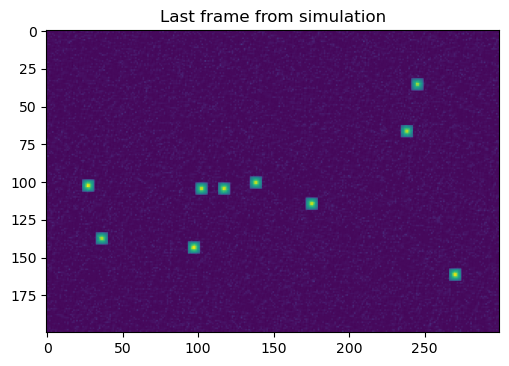

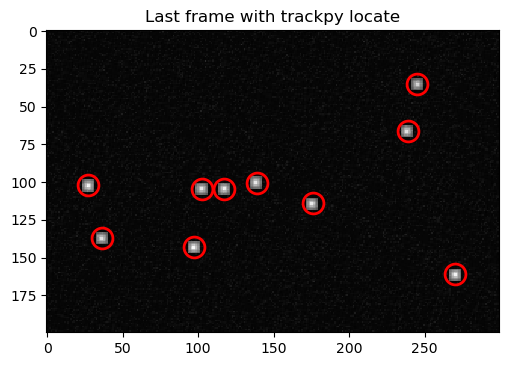

10
Great work, all particles are found


In [182]:
# Quick show of the last simulated frame
plt.imshow(movie[-1, :, :])
plt.title('Last frame from simulation')
plt.figure()

# Quick particle count on last frame
list1 = plis[:, 2]
numpar = len(list1)
f = trackpy.locate(movie[-1,:,:], 7, minmass= 40, invert =False)
plt.title('Last frame with trackpy locate')
trackpy.annotate(f, movie[-1,:,:]);
print(len(f['mass']))
if len(f['mass']) == numpar:
    print('Great work, all particles are found')
elif len(f['mass']) < numpar:
    difference = numpar-len(f['mass'])
    print('Not all particles are located, perhaps change some parameters. The difference is '+str(difference))
else:
    print('Oops, more particles are found than started. This is not posible.')

In [183]:
plt.title('Simulated Size histogram')
plt.hist(plis[:,2])

(array([1., 0., 0., 0., 2., 0., 4., 0., 1., 2.]),
 array([18.49926485, 18.84820086, 19.19713687, 19.54607288, 19.89500889,
        20.2439449 , 20.59288091, 20.94181691, 21.29075292, 21.63968893,
        21.98862494]),
 <BarContainer object of 10 artists>)

To do: Add fit to histogram!!!

What will happen if we take trackpy.batch on the same set of frames as we have used locate?
The code below gives the number of trajectories present, e.i. the number of located particles in the last frame, and also the total count of particles. Depending on the parameters, this number may vary significantly.

In [184]:
f_1 = trackpy.batch(movie[:,:,:], 7, minmass=40, invert=False, processes='auto')
t = trackpy.link(f_1, 11, memory=1) #  the first integer represents the maximum distance particles can move between frames, 
#memory shows the number of frames in which a particle can vanish and reappear shortly afterwards, to be considered the same particle. 
print(t['particle'].nunique())

Frame 19: 10 trajectories present.
10


The locate and batch function do not find all particles, since sometimes particles land too close together, causing trackpy to consider it one particle. To solve this, we look at each frame individually and count. This should eliminate 'doubles'.
Eventhough we execute the movie only, it also plots the last frame. 

Use a single frame

In [185]:
startframe = 0
endframe = nf 
startframe2 = 1 # +1 for accounting for the moving average
endframe2 = endframe-startframe

bgcorrected1 = sig[startframe2:endframe2,:,:] - np.mean([sig[startframe2-1:endframe2-1,:,:]], axis = 0)
print(bgcorrected1.shape) # to check the shape of the array(frames,x,y)

execute_amovie(bgcorrected1)

(19, 200, 300)


Use the 6 frames correction

In [186]:
startframe = 0
endframe = nf 
startframe2 = 6  # +1 for accounting for the moving average
endframe2 = endframe-startframe

bgcorrected2 = sig[startframe2:endframe2,:,:] - np.mean([sig[startframe2-1:endframe2-1,:,:],
                                                        sig[startframe2-2:endframe2-2,:,:],
                                                        sig[startframe2-3:endframe2-3,:,:],
                                                        sig[startframe2-4:endframe2-4,:,:],
                                                        sig[startframe2-5:endframe2-5,:,:]], axis = 0)
print(bgcorrected2.shape) # to check the shape of the array(frames,x,y)
execute_amovie(bgcorrected2)

(14, 200, 300)


Uncomment below to visualize individual frames

In [187]:
# for i in np.arange(0,bgcorrected.shape[0]): #decomment to show individual frames
#     im=plt.imshow(bgcorrected[i,:,:])
#     plt.title(f'Frame no.{i}: Difference between frame no.{i+1} and frame no.{i}')
#     plt.colorbar()
#     plt.pause(0.01)
#     plt.show()

The next step after the background correction with the moving average, is to count the particles. For this, we use the trackpy.locate function. 
Below, all frames are plotted, and it shows if, and how many particles are present. 

To do: create movie of locate frames visualised below!!!

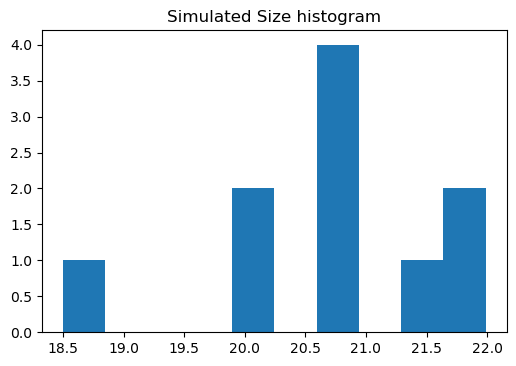

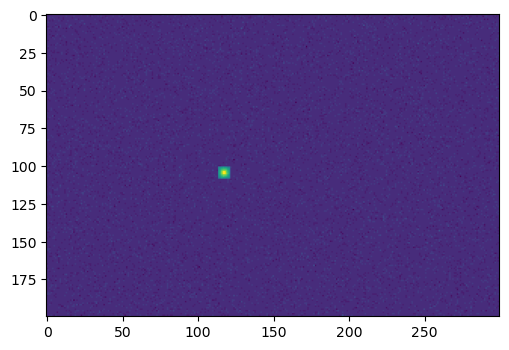

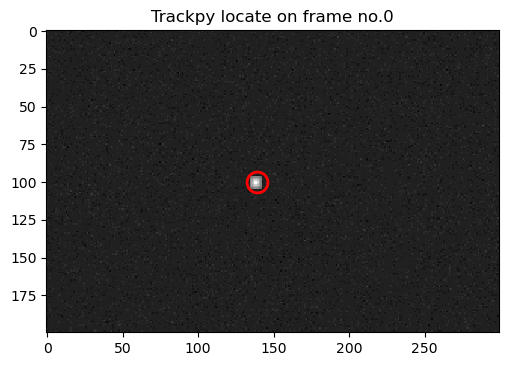

A non-zero value!, namely 1


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


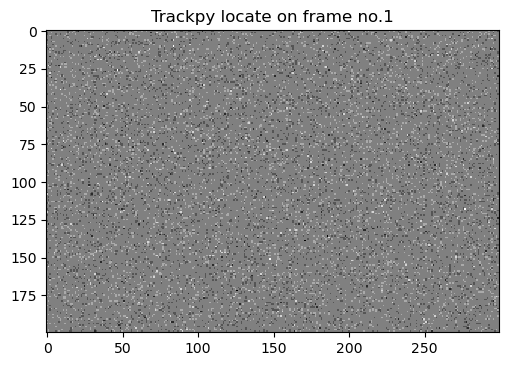

No particles located in this frame!


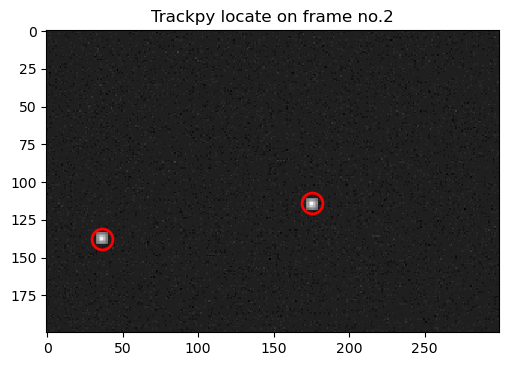

A non-zero value!, namely 2


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


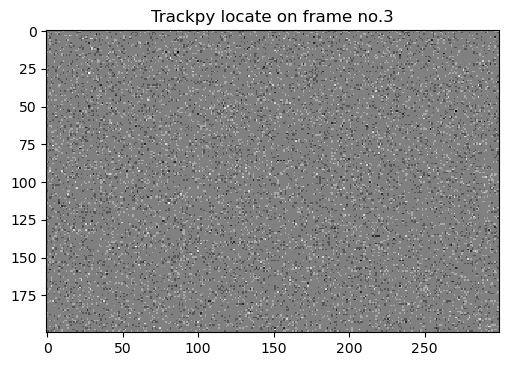

No particles located in this frame!


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


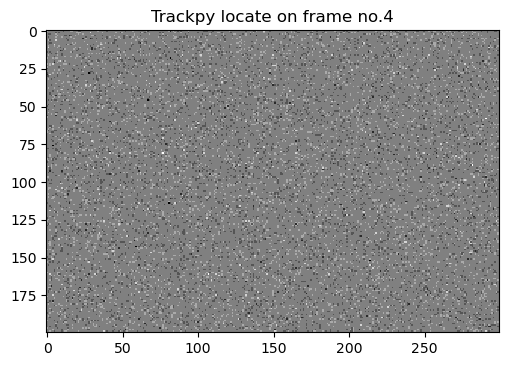

No particles located in this frame!


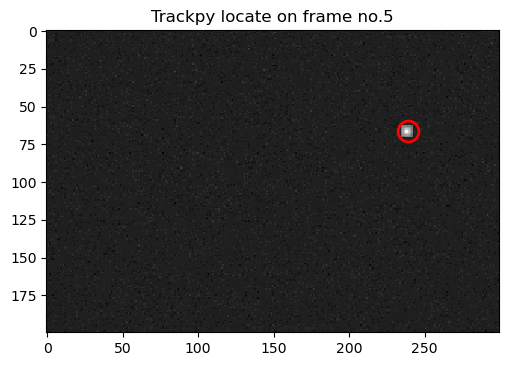

A non-zero value!, namely 1


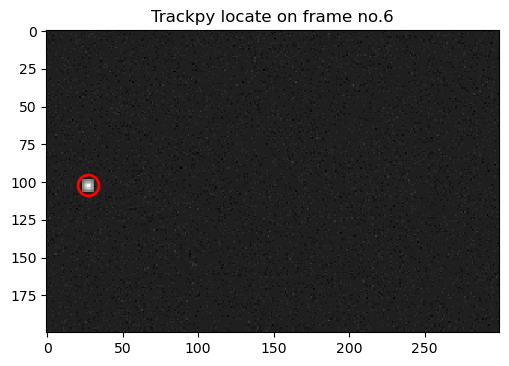

A non-zero value!, namely 1


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


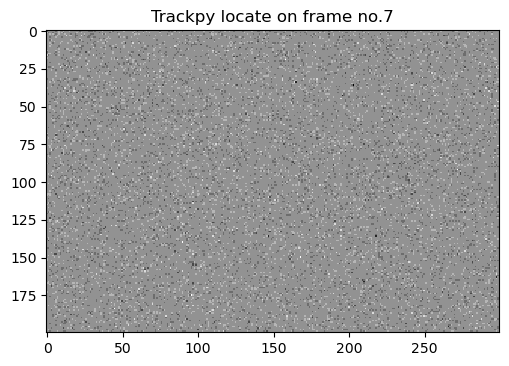

No particles located in this frame!


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


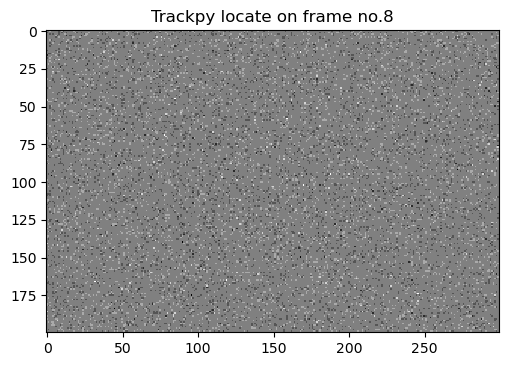

No particles located in this frame!


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


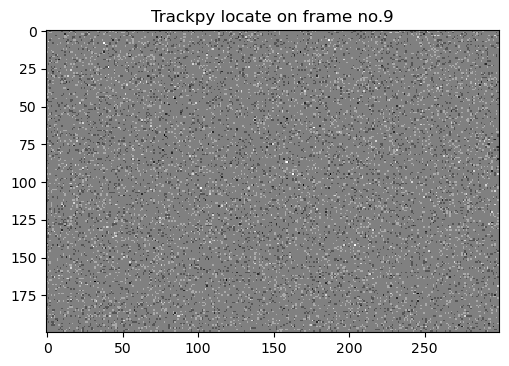

No particles located in this frame!


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


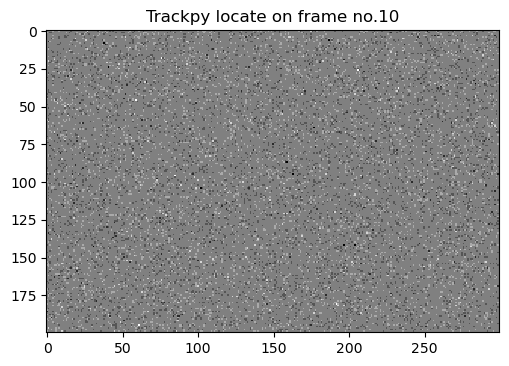

No particles located in this frame!


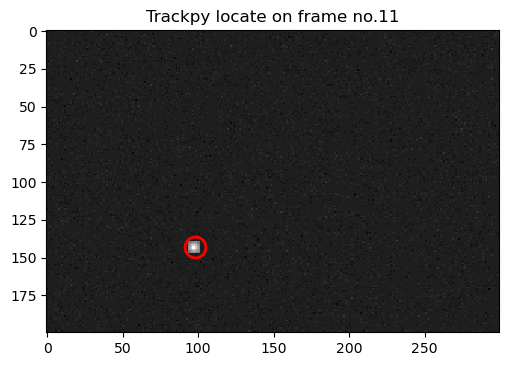

A non-zero value!, namely 1


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


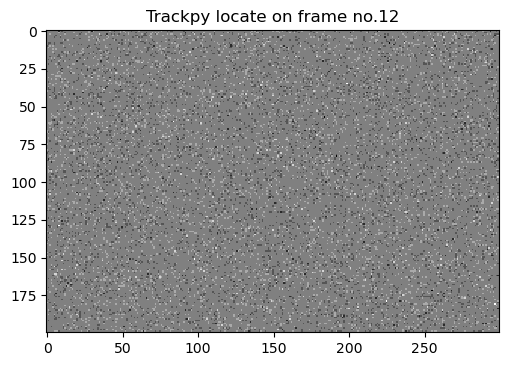

No particles located in this frame!


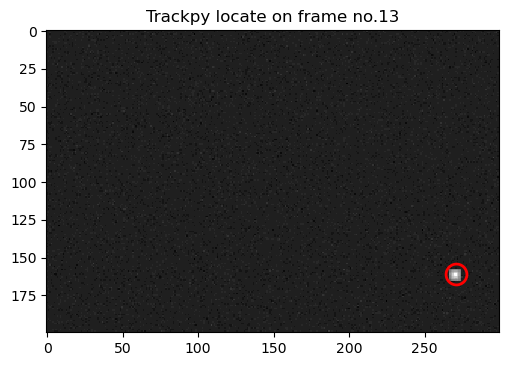

A non-zero value!, namely 1


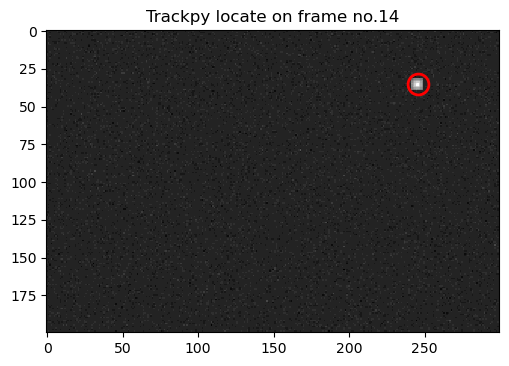

A non-zero value!, namely 1


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


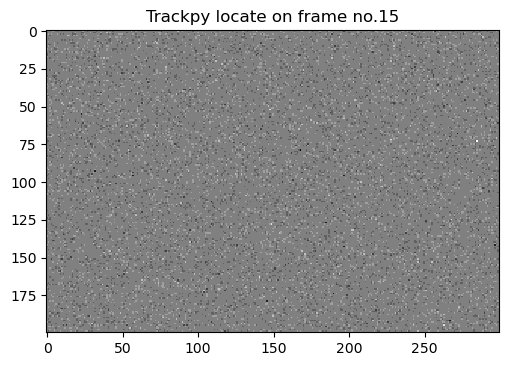

No particles located in this frame!


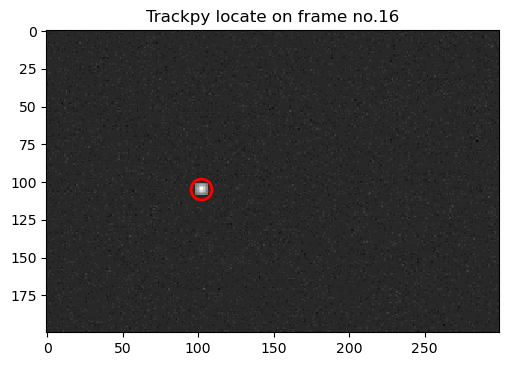

A non-zero value!, namely 1


C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\trackpy\feature.py:425: UserWarning: No maxima survived mass- and size-based filtering. Be advised that the mass computation was changed from version 0.2.4 to 0.3.0 and from 0.3.3 to 0.4.0. See the documentation and the convenience functions 'minmass_v03_change' and 'minmass_v04_change'.
  warnings.warn("No maxima survived mass- and size-based filtering. "


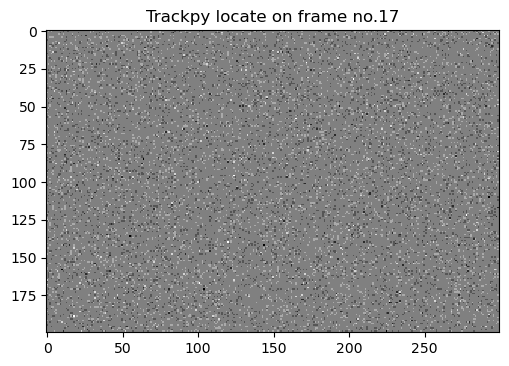

No particles located in this frame!


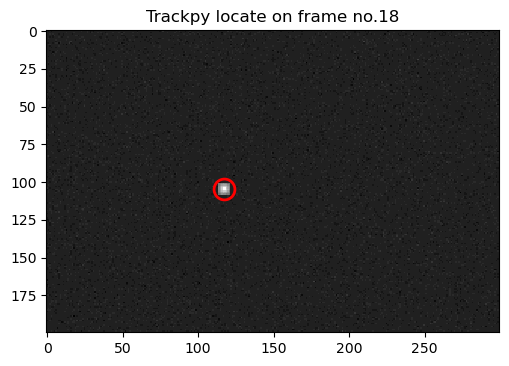

A non-zero value!, namely 1
The total number of landed particles = 10


In [188]:
particlelist = []
array = []
for i in np.arange(0, bgcorrected1.shape[0]):
    plt.title(f'Trackpy locate on frame no.{i}')
    f = trackpy.locate(bgcorrected1[i, :, :], 7, minmass=40, invert=False) # 7 = the est. pixel size, minmass = intensity 
    trackpy.annotate(f, bgcorrected1[i, :, :])
    particleframe = len(f['mass'])
    if len(f['mass']) != 0:
        print('A non-zero value!, namely '+str(particleframe))
        particlelist.append(len(f['mass']))
        array.append(i)
    else:
        print('No particles located in this frame!')

allparticles = sum(particlelist)
print('The total number of landed particles = '+str(allparticles))

Plot the total number of particles landed as a function of frame number

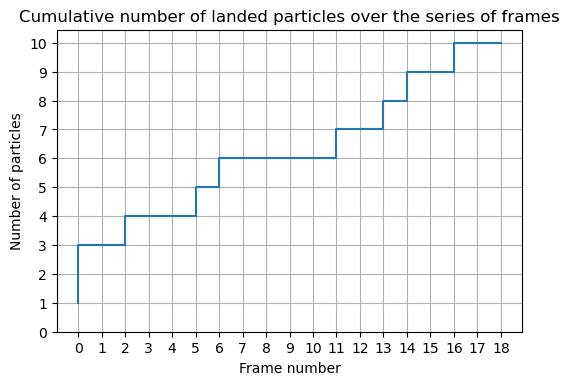

In [189]:
# print(array)  # on which frame are particles found
# print(particlelist)  # number of counts
cdf = np.cumsum(particlelist)
# plt.figure(figsize=(20,20))  # use larger figsize if the number of frames is high
plt.step(array, cdf)
plt.title('Cumulative number of landed particles over the series of frames')
plt.xlabel('Frame number')
plt.ylabel('Number of particles')
plt.xticks(np.arange(0, max(array)+1, 1.0))
plt.yticks(np.arange(0, max(cdf)+1, 1.0))
plt.grid()
plt.show()

C:\Users\brugg\Downloads\WPy64-3940\python-3.9.4.amd64\lib\site-packages\IPython\core\interactiveshell.py:3437: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


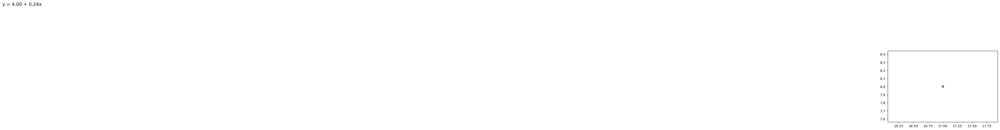

In [234]:
# x = np.array([0,10,20])
for i in range(0,18):
    x = np.array([i])
    
    y = np.array([i//2])

a,b = np.polyfit(x,y,1)
plt.scatter(x,y)
plt.plot(x,a*x+b, color='steelblue', linestyle='--', linewidth=2)
plt.text(1, 9, 'y = ' + '{:.2f}'.format(b) + ' + {:.2f}'.format(a) + 'x', size=14)
plt.show()

The above code shows the frame-by-frame locate function and finds the total amount of particles. The total number might differ, since not all created particles might have landed during the simulation. 
Now we look at analysing the frames at once with trackpy.batch and determine if this also works properly.

In [192]:
f_2 = trackpy.batch(bgcorrected2[:,:,:], 7, minmass=40, invert=False, processes='auto')

Frame 13: 2 features


All frames are analysed with trackpy batch. Below, the properties of all found particles are listed. 

In [193]:
f_2

,y,x,mass,size,ecc,signal,raw_mass,ep,frame
0,66.175038,238.823440,97.153754,2.007975,0.055278,4.713510,411.959243,0.004538,0
1,114.184793,175.125346,40.111044,2.015264,0.050482,1.885404,169.470064,0.010997,0
2,66.840998,238.847603,77.760658,2.022682,0.054660,3.538034,328.207394,0.006121,1
3,102.822817,27.170396,103.706240,2.018395,0.055849,4.850530,438.401576,0.004587,1
4,66.164499,238.182862,59.032820,2.005349,0.035722,2.890666,248.055546,0.004165,2
5,102.158902,27.151318,83.377647,2.022624,0.051344,3.824110,353.841261,0.002931,2
6,102.175399,27.182802,61.876592,2.010555,0.052931,2.995165,264.280945,0.008852,3
7,102.863797,27.870873,42.795988,1.996754,0.047840,2.144846,179.320630,0.006886,4
8,143.836975,97.839029,106.279270,2.013911,0.048866,5.060918,449.038959,0.002417,6
9,143.173291,97.183321,84.882421,2.011760,0.040078,4.020248,358.311167,0.002698,7


To do: add further trackpy code, as shown on the tutorial website and in the I_ParticleDrop_extended_trackpy_batch.ipynb notebook. http://localhost:8888/doc/tree/I_ParticleDrop_extended_trackpy_batch.ipynb !!!

To do: add simple bg correction

In [31]:
def Simple_backgroundcor(sig):
    bg = np.median(sig, axis=0)

    backgroundcor = np.zeros((nf, sig[0].shape[0], sig[0].shape[1]))

    dark = np.ones((fov))*5
    for i in range(nf):
        backgroundcor[i] = (sig[i] - bg)/(bg-dark)

    #  Set negative values to 0 
    backgroundcor[backgroundcor < 0] = 0

    return backgroundcor


Simple_backgroundcor(sig)
execute_amovie(Simple_backgroundcor(sig))

In [32]:
Histogram_intensities(bgcorrected)

In [33]:
movie_cutoff = Cutoff_movie(movie, 11)
execute_amovie(movie_cutoff)

In [34]:
img = sig[59]
im_fft = fft_img(img)

plt.figure()
plt.imshow(img)

plot_spectrum(im_fft)

IndexError: index 59 is out of bounds for axis 0 with size 22

In [ ]:
#Remember, the number you put into this is the fraction to keep
fft_cutoff(im_fft, 0.10)